<a href="https://colab.research.google.com/github/DanileRond/ARAP/blob/main/CV_homographies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Computer Vision with Deep Learning**
# Homographies

2021 - Javier Ruiz Hidalgo - [GPI @ IDEAI](https://imatge.upc.edu/web/) Research group [ETSETB – UPC.TelecosBCN](https://telecos.upc.edu/ca)

The work in this session will address the problem of finding homographies between images. The homographies will be used in two different aplications: 1) creating panoramas from a set of photographs and 2) augmented reality. 

We will be using the some additional images. First of all download them from ATENEA and upload them to the Colaboratory notebook using the menu on the left (click the folder icon, upload all the files). 

In [1]:
# The SIFT patent has exprired recently. In the last versions of
# OpenCV, the SIFT functionality is already in the main module
# Install a new version of opencv
# This can be removed when Colab uses a modern enough version of opencv by default
!pip install opencv-contrib-python==4.4.0.46

     |████████████████████████████████| 55.7MB 75kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


Let's define two functions to display images:

In [89]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display one image
def display_image(img, title='', size=None, show_axis=False):
    plt.gray()
    if not show_axis:
      plt.axis('off')
    h = plt.imshow(img, interpolation='none')
    if size:
        dpi = h.figure.get_dpi()/size
        h.figure.set_figwidth(img.shape[1] / dpi)
        h.figure.set_figheight(img.shape[0] / dpi)
        h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
        h.axes.set_position([0, 0, 1, 1])
        if show_axis:
            h.axes.set_xlim(-1, img.shape[1])
            h.axes.set_ylim(img.shape[0], -1)
    plt.grid(False)
    plt.title(title)  
    plt.show()

# Function to display 2 images side by side
def display_images(ima1, ima2, title1='', title2='', size=None, show_axis=False, hsep=0.1):
    fig, ax = plt.subplots(1,2)
    plt.grid(False)
    h = ax[0].imshow(ima1.astype(np.uint8), cmap=plt.cm.gray)
    ax[0].set_title(title1)

    if size:
        dpi = h.figure.get_dpi()/size
        h.figure.set_figwidth(ima1.shape[1] / dpi)
        h.figure.set_figheight(ima1.shape[0] / dpi)
        h.figure.canvas.resize(ima1.shape[1] + 1, ima1.shape[0] + 1)
        h.axes.set_position([0, 0, 1, 1])

    if not show_axis:
        ax[0].axis('off')
    else: 
        ax[0].axes.set_xlim(-1, ima1.shape[1])
        ax[0].axes.set_ylim(ima1.shape[0], -1)

    h = ax[1].imshow(ima2.astype(np.uint8), cmap=plt.cm.gray)
    ax[1].set_title(title2)

    if size:
        dpi = h.figure.get_dpi()/size
        h.figure.set_figwidth(ima2.shape[1] / dpi)
        h.figure.set_figheight(ima2.shape[0] / dpi)
        h.figure.canvas.resize(ima2.shape[1] + 1, ima2.shape[0] + 1)
        h.axes.set_position([1+hsep, 0, 1, 1])

    if not show_axis:
        ax[1].axis('off')
    else: 
        ax[1].axes.set_xlim(-1, ima2.shape[1])
        ax[1].axes.set_ylim(ima2.shape[0], -1)

    plt.show()

## **Homographies estimation between images**

In this part you will estimate the homographies between images to represent them in the same reference. 

We will use the SIFT algorithm reviewed in Unit 1 of the course to select keypoint and match them. 


Let's read the corresponding images as gray level.

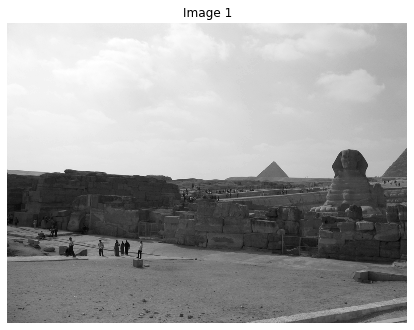

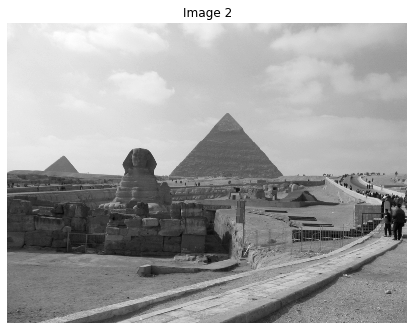

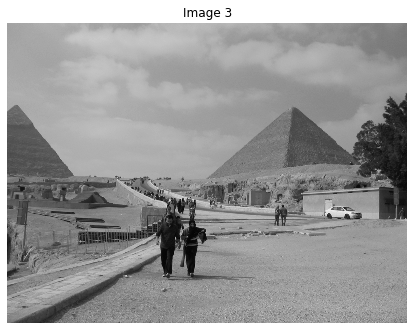

In [90]:
filename1 = 'cairo1.png'
filename2 = 'cairo2.png'
filename3 = 'cairo3.png'

# Read the images and convert to gray level
ima1 = cv2.imread(filename1,0) 
ima2 = cv2.imread(filename2,0) 
ima3 = cv2.imread(filename3,0) 
display_image (ima1, 'Image 1', size = 0.5)
display_image (ima2, 'Image 2', size = 0.5)
display_image (ima3, 'Image 3', size = 0.5)

Let's compute the SIFT descriptors for the three images, match them between images and show the correspondences:

The number of matches between Image 1 and 2 is: 322
The number of matches between Image 2 and 3 is: 491


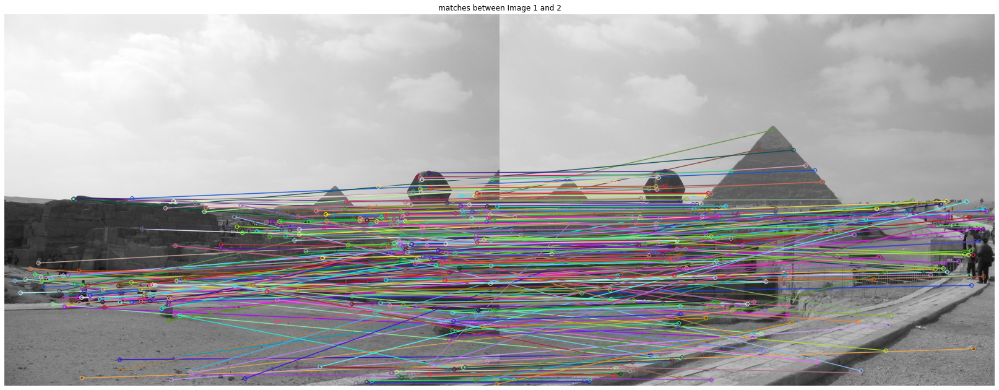

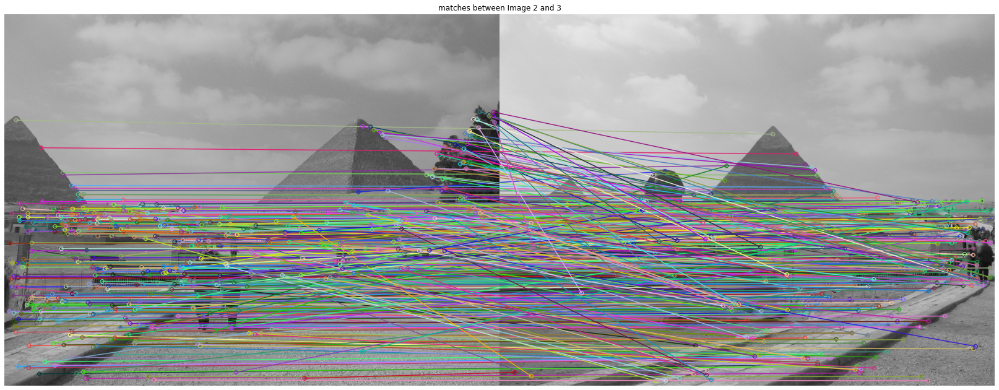

In [91]:
sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(ima1,None)
kp2, des2 = sift.detectAndCompute(ima2,None)
kp3, des3 = sift.detectAndCompute(ima3,None)

# create BFMatcher object
bf = cv2.BFMatcher(crossCheck=True)

# Match descriptors.
matches12 = bf.match(des1,des2)
print('The number of matches between Image 1 and 2 is: {}'.format(len(matches12)))

matches32 = bf.match(des3,des2)
print('The number of matches between Image 2 and 3 is: {}'.format(len(matches32)))

# Draw matches.
img12 = cv2.drawMatches(ima1,kp1,ima2,kp2,matches12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img32 = cv2.drawMatches(ima3,kp3,ima2,kp2,matches32,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

display_image(img12, 'matches between Image 1 and 2', size=1)
display_image(img32, 'matches between Image 2 and 3', size=1)


Now, we will use the function cv2.findHomography() to estimate the homography $H_1$ between the images cairo1 and cairo2 and the homography $H_2$ between cairo3 and cairo2.

The computation of the homography using least squares (LS) is very sensitive to false correspondences in the matching process. For this reason, we will use RANSAC to estimate the homography. The process consists of selecting four random correspondences, finding an homography using these correspondences and determining the number of inliers by reprojecting the keypoints using the computed homography. If a projected keypoint coincides with its correspondence in the other image, we count it as an inlier. This process is iterated many times and the homography with more inliers is used. Fortunately, cv2.findHomography() allows to do all this just by passing cv2.RANSAC as the third parameter.


In [92]:
# pts_src and pts_dst are numpy arrays of points in source and destination 
#images. We need at least 4 corresponding points.

MIN_MATCH_COUNT = 4

# https://docs.opencv.org/master/d1/de0/tutorial_py_feature_homography.html
if len(matches12) > MIN_MATCH_COUNT:
    src_pts12 = np.float32([ kp1[m.queryIdx].pt for m in matches12 ]).reshape(-1,1,2)
    dst_pts12 = np.float32([ kp2[m.trainIdx].pt for m in matches12 ]).reshape(-1,1,2)
    H1, mask1 = cv2.findHomography(src_pts12, dst_pts12, cv2.RANSAC,5.0)

if len(matches32) > MIN_MATCH_COUNT:
    src_pts32 = np.float32([ kp3[m.queryIdx].pt for m in matches32 ]).reshape(-1,1,2)
    dst_pts32 = np.float32([ kp2[m.trainIdx].pt for m in matches32 ]).reshape(-1,1,2)
    H2, mask2 = cv2.findHomography(src_pts32, dst_pts32, cv2.RANSAC,5.0)

# Set formatting options to print nicer matrices
np.set_printoptions(formatter={'float': lambda x: "{0:10.3f}".format(x)})

print ('H1 = ')
print (H1)
print ('H2 = ')
print (H2)

H1 = 
[[     1.529     -0.073   -644.515]
 [     0.243      1.409   -163.253]
 [     0.001      0.000      1.000]]
H2 = 
[[     0.661      0.041    409.020]
 [    -0.154      0.855     41.570]
 [    -0.000     -0.000      1.000]]


We can check where the four cairo1 corners will be projected by the homography into the cairo2 image. We will use function cv2.perspectiveTransform() for this purpose. 

In [93]:
h,w = ima1.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,H1)
print ('Coordinates of ima1 corners projected by H1:') 
print (dst)

Coordinates of ima1 corners projected by H1:
[[[  -644.515   -163.253]]

 [[  -679.112    671.540]]

 [[   351.316    576.280]]

 [[   383.577     20.715]]]


Note that some points have negative coordinates. This means that they are outside the margins of the image cairo2.

To better visualize this, we can draw a closed polygon using the coordinates in pts. This will draw the projected borders of cairo1 in cairo2, thus showing the overlap between the images. As the some coordinates are negative, only a part of the polygon is visible.

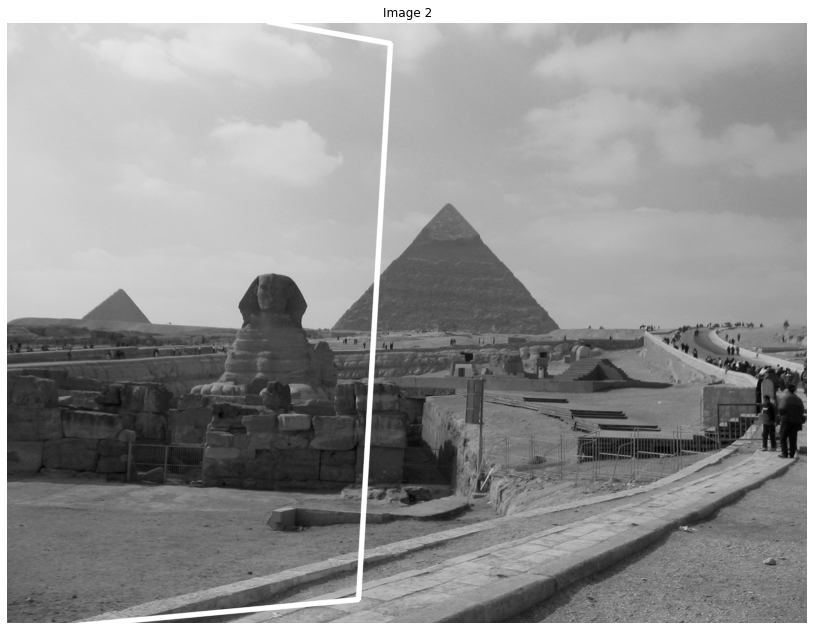

In [94]:
# Draw the projected borders of cairo1. This will show the overlap between the images
ima2_tmp = cv2.polylines(ima2.copy(),[np.int32(dst)],True,255,3, cv2.LINE_AA)
display_image(ima2_tmp, 'Image 2', size=1.0) 

Even if the matching results in lots of false correspondences, the homography is correctly computed. This is because we used the parameter **cv2.RANSAC** when computing the homography. Using this parameter, the false correspondences (outliers) are not used to compute the homography. You can try to use a 0 instead of the parameter cv2.RANSAC. This way, the function uses simply the least squares (LS) method to compute the homography. If there are many false correspondences, the LS method may fail resulting in a wrong homography. The effect of this would be that the projected points would fail at incorrect positions.

Now, we want to project all pixels from ima1 so that they are in the same reference as ima2. This is called a **forward projection**. We will use the computed homography and the function cv2.perspectiveTransform() to project the coordinates. We will loop for each pixel in ima1 and project its coordinates. If they fall inside ima2, we will put the value of the pixel in ima1 at the projected coordinate in ima2.

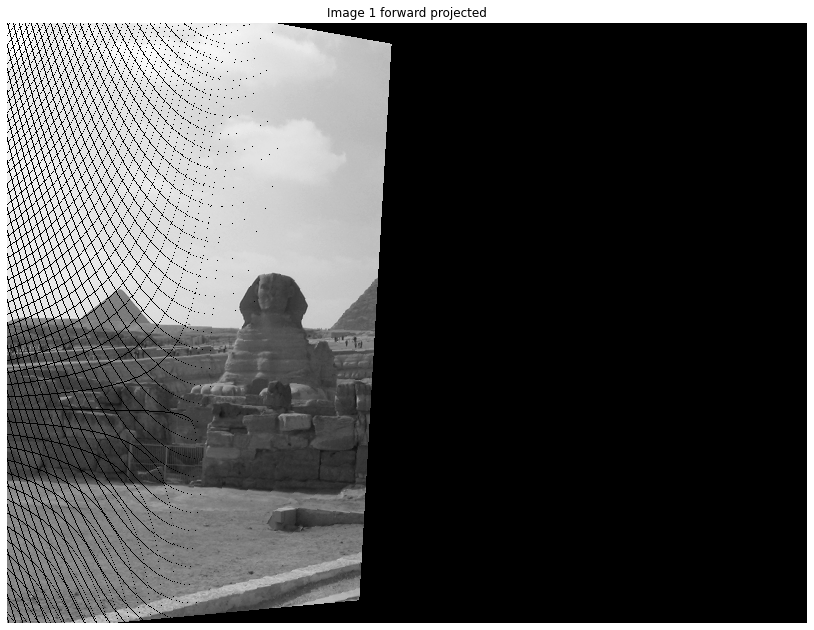

In [95]:
# Forward warping: loop for each pixel in ima1 and project it. If it falls
# inside ima2, put the value of the pixel in ima1 in the projected coordinate 
# in ima2
ima1_proj_forw = np.zeros_like(ima2)
for ii in range(0,ima1.shape[0]):
  for jj in range(0,ima1.shape[1]):
    # Coordinate [jj,ii] in ima1
    pts = np.float32([jj,ii])
    # reshape is needed because opencv needs extra dimensions
    pts = pts.reshape(-1,1,2) 

    # Find the projected coordinates
    dst = cv2.perspectiveTransform(pts,H1)
    # Round the coordinates and convert to integer
    # This is equivalent to use Nearest Neighbor interpolation
    dst = np.round(dst).astype(int)
    # Remove extra dimensions
    dst = np.squeeze(dst)

    # Check if the projected coordinates fall inside ima2
    if dst[0] >= 0 and dst[0] < ima1_proj_forw.shape[1] and dst[1] >= 0 and dst[1] < ima1_proj_forw.shape[0]:
      # Copy the pixel value to ima2
      ima1_proj_forw[dst[1],dst[0]] = ima1[ii,jj] 

display_image(ima1_proj_forw, 'Image 1 forward projected', size=1.0) 

As you can see, only the overlapping region can be seen. This is because the non-overlapping pixels are projected into negative coordinates and thus, outside the image. Later, we will use a method to recover the missing part.

Note that holes may appear in the projection. This can be better seen by visualizing a small portion of the image

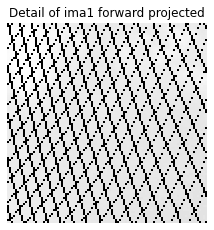

In [96]:
display_image(ima1_proj_forw[0:100,0:100], 'Detail of ima1 forward projected', size=2.0) 

To avoid the holes, we can use a backward projection. In this case, for all coordinates inside ima2 we determine from which position ima1 they come from. For this, we have to reverse the homography. This can be done by inverting the homography matrix $H_1$.

<font color=red>**Question 1: Finish the code BELOW to perform the backward projection of ima1 into ima2. Do you see holes in the projection?**</font>

<font color=blue>**No, there are not holes.**</font>

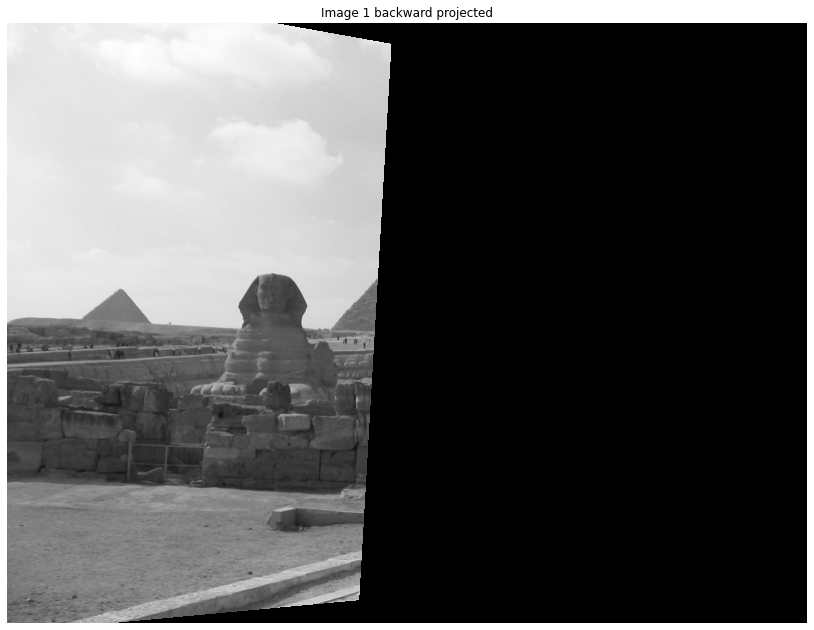

In [97]:
H1_inv = np.linalg.inv(H1)

# Backward warping: loop for each pixel (ii,jj) in ima2 and project it using the 
# inverted homography. If the resulting point (kk, ll) falls inside ima1, put 
# the value of the pixel in ima1[kk,ll] in ima1_proj_back[ii,jj]
ima1_proj_back = np.zeros_like(ima2)

# TODO: create the backward projection
for ii in range(0,ima2.shape[0]):
  for jj in range(0,ima2.shape[1]):
    # Coordinate [jj,ii] in ima2
    pts = np.float32([jj,ii])
    # reshape is needed because opencv needs extra dimensions
    pts = pts.reshape(-1,1,2) 

    # Find the projected coordinates
    dst = cv2.perspectiveTransform(pts,H1_inv)
    # Round the coordinates and convert to integer
    # This is equivalent to use Nearest Neighbor interpolation
    dst = np.round(dst).astype(int)
    # Remove extra dimensions
    dst = np.squeeze(dst)

    # Check if the projected coordinates fall inside ima2
    if dst[0] >= 0 and dst[0] < ima1_proj_back.shape[1] and dst[1] >= 0 and dst[1] < ima1_proj_back.shape[0]:
      # Copy the pixel value to ima2
      ima1_proj_back[ii,jj] = ima2[ii,jj] 


display_image(ima1_proj_back, 'Image 1 backward projected', size=1.0) 

OpenCV already provides a function to perform the backward projection. It is called cv2.warpPerspective(). This function performs the matrix inversion and the backward projection. You should obtain the same result as in the case of your backward projection but using only a line of code.

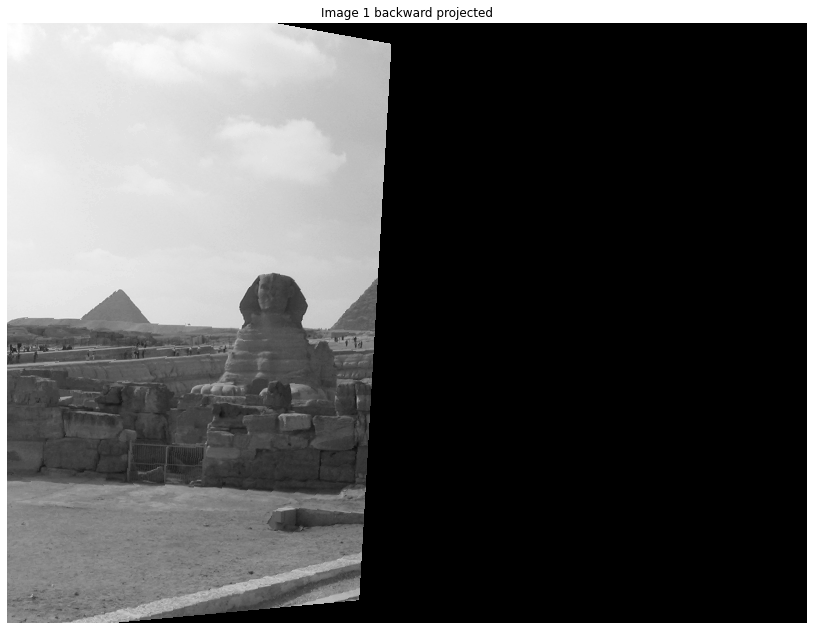

In [98]:
im_dst_nn = cv2.warpPerspective(ima1, H1, (ima2.shape[1], ima2.shape[0]), flags=cv2.INTER_NEAREST)
display_image(im_dst_nn, 'Image 1 backward projected', size=1.0) 

In the previous code we have used Nearest Neighbor interpolation to solve the cases when the projected coordinates land between two pixels. There is a better way to perform this operation by using bilinear interpolation (see the slides).

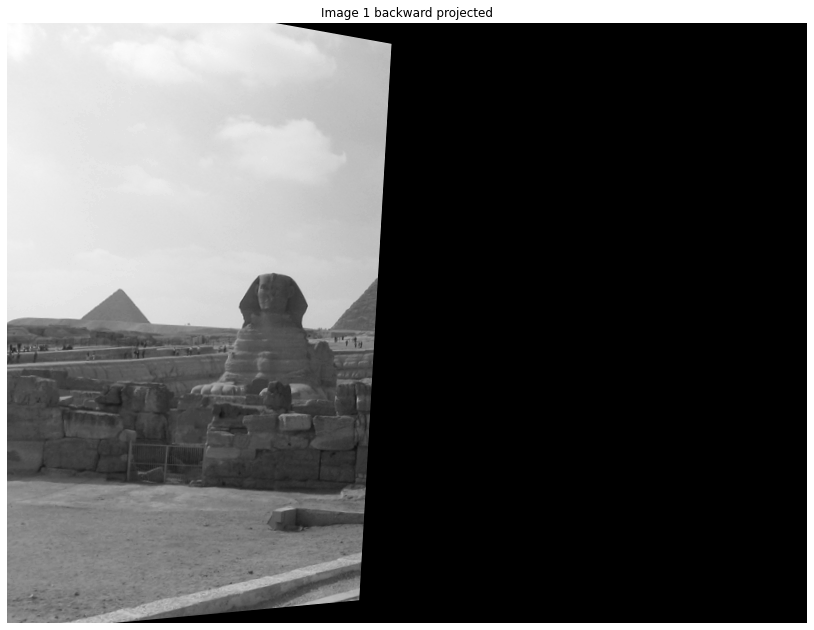

In [99]:
im_dst = cv2.warpPerspective(ima1, H1, (ima2.shape[1], ima2.shape[0]), flags=cv2.INTER_LINEAR)
display_image(im_dst, 'Image 1 backward projected', size=1.0) 

Let's look at a zoomed crop of the image to see the differences between two methods:

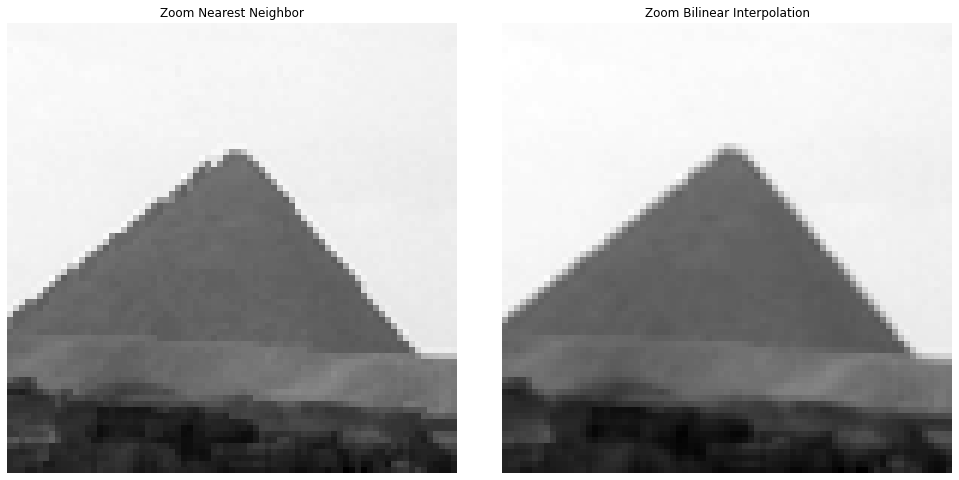

In [100]:
tmp_nn = im_dst_nn[245:245+75, 75:75+75]
tmp_bi = im_dst[245:245+75,    75:75+75]

display_images(tmp_nn, tmp_bi, 'Zoom Nearest Neighbor', 'Zoom Bilinear Interpolation', size=6.0)

<font color=red>**Question 2: Comment the differences between the two types of interpolation.**</font>

<font color=blue>**The KNN interpolation shows several holes in the contour of the pyramid. This can be due to the nearest pixel are sky pixel values. Secondly, in the bilinear interpolation, we can see the axes well formed due to bilinear interpolation averages the values of the pixels near to the target one.**</font>

Now, let's find the projection for ima3:

In [101]:
h,w = ima3.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,H2)

print ('Coordinates of ima3 corners projected by H2:') 
print (dst)

Coordinates of ima3 corners projected by H2:
[[[   409.020     41.570]]

 [[   456.224    582.727]]

 [[  1484.656    665.125]]

 [[  1343.953   -116.686]]]


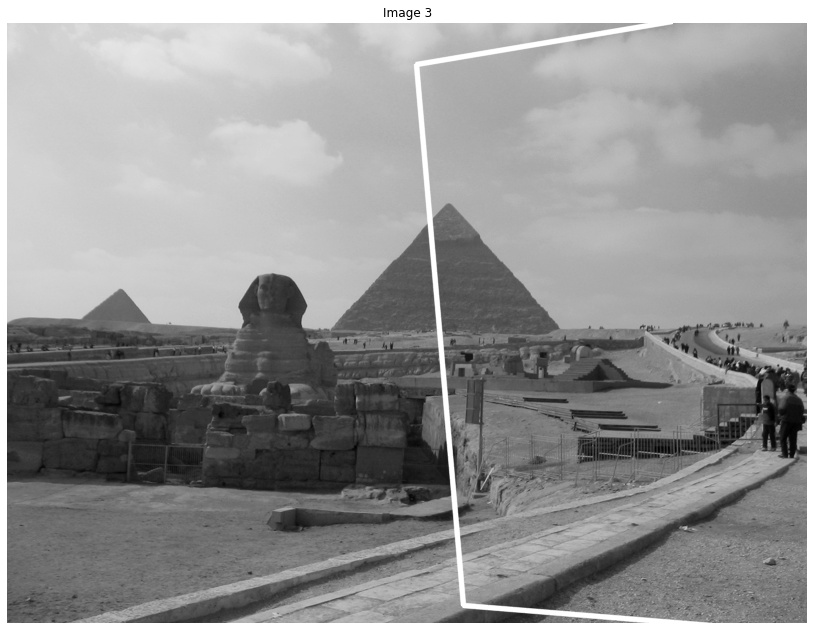

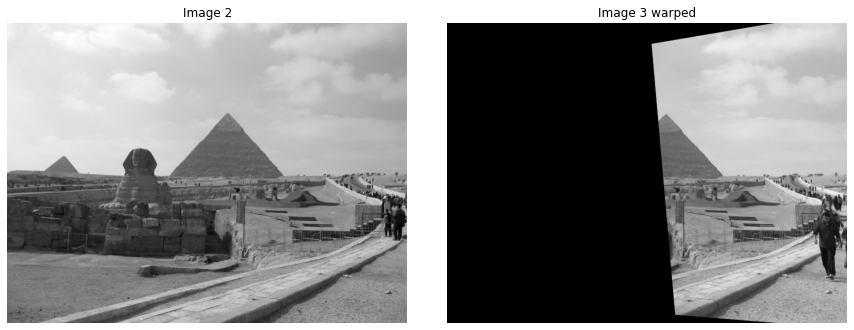

In [102]:
# Draw the projected borders of cairo1. This will show the overlap between the images
ima3_tmp = cv2.polylines(ima2.copy(),[np.int32(dst)],True,255,3, cv2.LINE_AA)
display_image(ima3_tmp, 'Image 3', size=1.0) 

im_dst = cv2.warpPerspective(ima3, H2, (ima2.shape[1], ima2.shape[0]), flags=cv2.INTER_LINEAR)
display_images(ima2, im_dst, 'Image 2', 'Image 3 warped', size=0.5) 

## **Creation of the panorama image**

In this part you will apply the homographies calculated in previous parts and create a single panorama image by projecting all the images to a common reference. To create the panorama you will use a larger image to fit cairo1, cairo2 and cairo3. 

First, we have to compute the size of the output image. it must be able to contain the minimum coordinate when projecting ima1 and the maximum coordinate when projecting ima3. 


In [103]:
# project the 4 ima1 corner coordinates to find the minimum
h,w = ima1.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst1 = cv2.perspectiveTransform(pts,H1)
dst1 = np.squeeze(dst1) # Remove extra dimensions
dst1 = np.round(dst1).astype(int)   # Convert to integer
print ('Coordinates of ima1 corners projected by H1:') 
print (dst1)

# project the 4 ima3 corner coordinates to find the maximum
h,w = ima3.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst2 = cv2.perspectiveTransform(pts,H2)
dst2 = np.squeeze(dst2)
dst2 = np.round(dst2).astype(int)   # Convert to integer
print ('Coordinates of ima3 corners projected by H2:') 
print (dst2)

# Find the minimum x and y coordinates of the projected ima1 corners
min1 = np.min(dst1,axis=0)
min_x1, min_y1 = min1[0], min1[1]
max1 = np.max(dst1, axis=0)
max_x1, max_y1 = max1[0], max1[1]

# Find the maximum x and y coordinates of the projected ima3 corners
max3 = np.max(dst2,axis=0)
max_x3, max_y3 = max3[0], max3[1]
min3 = np.min(dst2,axis=0)
min_x3, min_y3 = min3[0], min3[1]

min_y = min(min_y1, min_y3)
max_y = min(max_y1, max_y3)

# Compute the dimensions of the panorama image
pano_width  = max_x3 - min_x1 + 1 # Assuming images are ordered left-to-right
pano_height = max_y  - min_y  + 1
print ('The dimensions of the panorama image must be: ({},{})'.format(pano_height,pano_width))

Coordinates of ima1 corners projected by H1:
[[-645 -163]
 [-679  672]
 [ 351  576]
 [ 384   21]]
Coordinates of ima3 corners projected by H2:
[[ 409   42]
 [ 456  583]
 [1485  665]
 [1344 -117]]
The dimensions of the panorama image must be: (829,2165)


Now, all the projected coordinates must fall into the new panorama image. To achieve that we have to apply a translation. The translation must be (abs(min_x1), abs(min_y)). This way, all the projected coordinates will be positive. To preserve the same reference for all three images, we will have to apply the same translation to all of them.


In [104]:
# Compute the translation necessary to make sure that all projected coordinates 
# fall inside the panorama image
trans_x = np.abs(min_x1)
trans_y = np.abs(min_y)

print ('Translation: tranx_x = {}, trans_y = {}'.format(trans_x, trans_y))

Translation: tranx_x = 679, trans_y = 163


Now we will put the three images into the panorama image. We will start with ima2. To do this, we need to find the homography that translates ima2 into the panorama image by (trans_x, trans_y). 


<font color=red>**Question 3: Manually create the Homography matrix in the code BELOW that correspond to the translation defined above.**</font>

<font color=blue>**Answer here in blue in case you have any comment.**</font>

In [105]:
# TODO: replace the values of hij with the proper values for a translation of
#       trans_x columns and trans_y rows

Ht = np.array([[1.0, 0.0, float(trans_x)],[0.0, 1.0, float(trans_y)], [0.0, 0.0, 1.0]])

print ('Translation Homography:') 
print (Ht)


Translation Homography:
[[     1.000      0.000    679.000]
 [     0.000      1.000    163.000]
 [     0.000      0.000      1.000]]


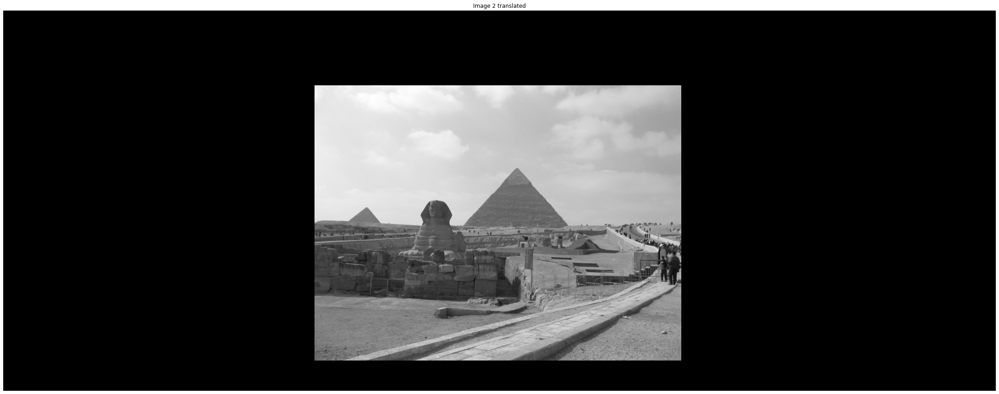

In [106]:
# The calculated homography can be used to warp the source image to destination.
im_dst2 = cv2.warpPerspective(ima2, Ht, (pano_width, pano_height), flags=cv2.INTER_LINEAR)
display_image(im_dst2, 'Image 2 translated', size=1.0) 

To project ima1 into the panorama image we have to combine the homographies $H_1$ and $H_t$. Homographies are combined using matrix multiplication.

Homography matrix after combining H1 and Ht
[[     1.958     -0.058     34.485]
 [     0.346      1.413     -0.253]
 [     0.001      0.000      1.000]]


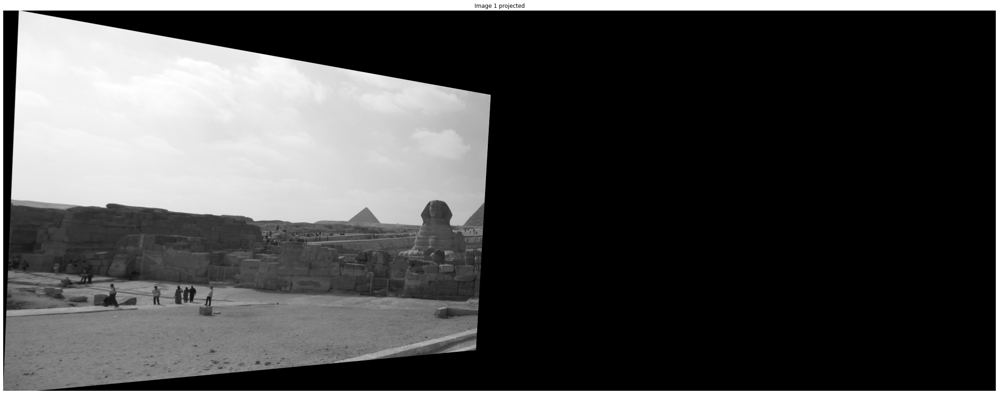

In [107]:
H1t = np.matmul(Ht,H1)
print ('Homography matrix after combining H1 and Ht') 
print (H1t)

im_dst1 = cv2.warpPerspective(ima1, H1t, (pano_width, pano_height), flags=cv2.INTER_LINEAR)
display_image(im_dst1, 'Image 1 projected', size=1.0) 

Same for ima3:

Homography matrix after combining H2 and Ht
[[     0.404     -0.015   1088.020]
 [    -0.216      0.842    204.570]
 [    -0.000     -0.000      1.000]]


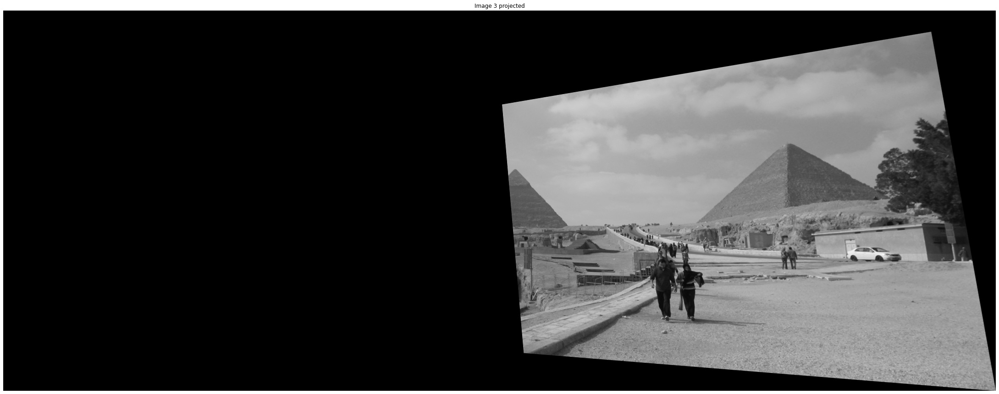

In [108]:
H2t = np.matmul(Ht,H2)
print ('Homography matrix after combining H2 and Ht') 
print (H2t)

im_dst3 = cv2.warpPerspective(ima3, H2t, (pano_width, pano_height), flags=cv2.INTER_LINEAR)
display_image(im_dst3, 'Image 3 projected', size=1.0) 

To combine the three images into a single panorama (pano_ima_sup), we can start with the projected ima1 image, then fill the non-zero pixels in this image with pixels from projected ima2 and finally from projected ima3.  

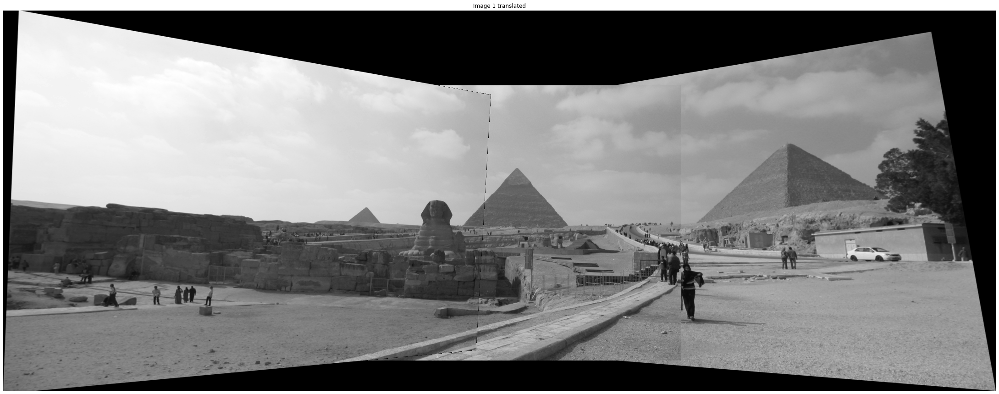

In [109]:
# Blending
pano_ima_sup = im_dst1.copy()
pano_ima_sup[pano_ima_sup == 0] = im_dst2[pano_ima_sup==0]
pano_ima_sup[pano_ima_sup == 0] = im_dst3[pano_ima_sup==0]

display_image(pano_ima_sup, 'Image 1 translated', size=1.0) 

In this approach the pixels that overlap between ima1 and ima2 are taken exclusively from ima1, and the pixels that overlap between ima2 and ima3 are taken from ima2 exclusively. Another solution would be to average the overlapping pixels. 


<font color=red>**Question 4: Modify the blending code below to use an average between the input images. HINT: you can perform a double loop over all the pixels.**</font>

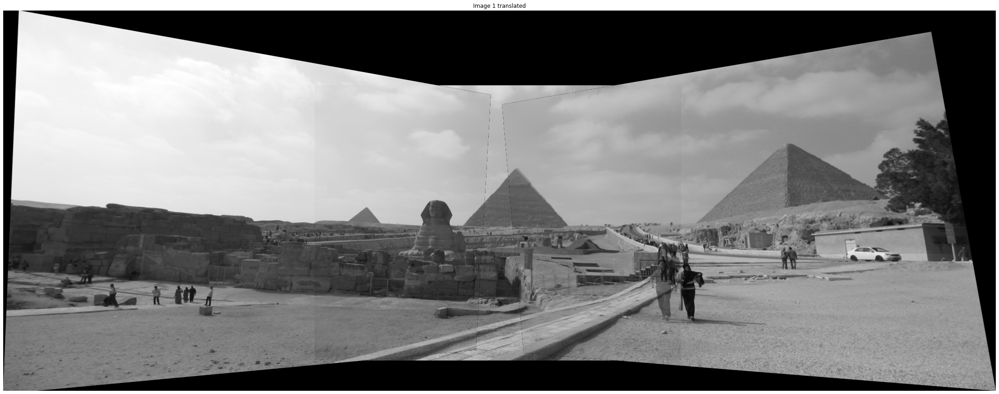

In [112]:
# Blending
pano_ima_avg = im_dst1 + im_dst3 # Assuming there is no overlap between ima1 and ima3
import statistics

# TODO: create the panorama by averaging the input images in the overlap areas.
pano_ima_avg = im_dst1 + im_dst3 # Assuming there is no overlap between ima1 and ima3
for ii in range(0,pano_ima_avg.shape[0]):
  for jj in range(0,pano_ima_avg.shape[1]):
    if pano_ima_avg[ii][jj] == 0:
      pano_ima_avg[ii][jj] = im_dst2[ii][jj]
    if im_dst2[ii][jj] != 0 and im_dst1[ii][jj] != 0:
      pano_ima_avg[ii][jj] = statistics.mean([im_dst2[ii][jj], im_dst1[ii][jj]])
    if im_dst2[ii][jj] != 0 and im_dst3[ii][jj] != 0:
      pano_ima_avg[ii][jj] = statistics.mean([im_dst2[ii][jj], im_dst3[ii][jj]])



display_image(pano_ima_avg, 'Image 1 translated', size=1.0)

<font color=red>**Question 5: How does this change the resulting panorama? Which option you believe is better, with averages or simply copying a single value from the images?**</font>

<font color=blue>**In this way, transitions are more smoother than copying directly the value on the image**</font>

## **Augmented reality**

Now we will use homographies to paste some (source) images into the planar surfaces of a destination image.

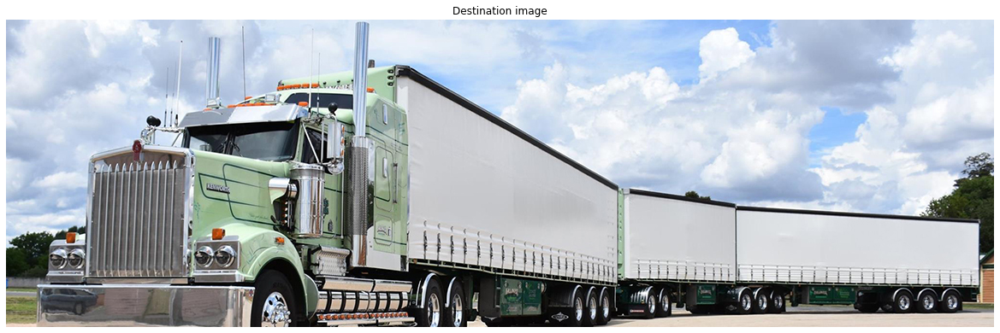

In [81]:
# Read destination image                                                                                                
im_dst = cv2.imread('road-trains-hero.jpg');

# OpenCV reads images in BGR format. Convert to RGB
im_dst = cv2.cvtColor(im_dst, cv2.COLOR_BGR2RGB)

display_image(im_dst, 'Destination image', size=1.0) 

First we will determine the flat surfaces where we will paste the images. In the image of the truck, the three trailers' side walls are good candidates. To characterize the surfaces, we need to obtain the coordinates of the four corners of each planar region. 

<font color=red>**Question 6: Use any image editor program ([Gimp](https://www.gimp.org/), [Irfanview](https://www.irfanview.com/), etc.) to find the 4 corner locations for the remaining 2 surfaces and paste them in the code BELOW:**</font>

<font color=blue>**Answer here in blue in case you have any comments.**</font>

In [82]:

surface1 = np.array([[471,68],[712,203],[713,306],[471,275]], dtype=float).reshape(-1,1,2)

# TOD: create surface2 and surface3 similarly to the one above with the coordinates of the other two trailers' side walls.

im_dst2 = np.zeros_like(ima2)
Ht = np.array([[1.0, 0.0, float(trans_x)],[0.0, 1.0, float(trans_y)], [0.0, 0.0, 1.0]])

surface2 = np.array([[729,207],[854,221],[853,306],[726,302]], dtype=float).reshape(-1,1,2)
surface3 = np.array([[856,225],[1138,239],[1136,310],[858,303]], dtype=float).reshape(-1,1,2)

Let's draw the borders of the surfaces over the image for a better understanding.

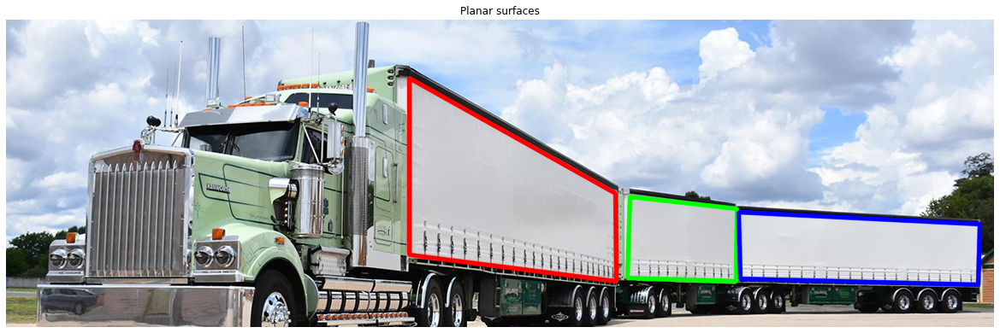

In [83]:
im_tmp = cv2.polylines(im_dst.copy(),[np.int32(surface1)],True,(255,0,0),3, cv2.LINE_AA)
im_tmp = cv2.polylines(im_tmp,[np.int32(surface2)],True,(0,255,0),3, cv2.LINE_AA)
im_tmp = cv2.polylines(im_tmp,[np.int32(surface3)],True,(0,0,255),3, cv2.LINE_AA)

display_image(im_tmp, 'Planar surfaces', size=1.0) 

Let's load the image that will be overlapped into the destination image. We will use the previous cairo1.png photo for the first surface. 

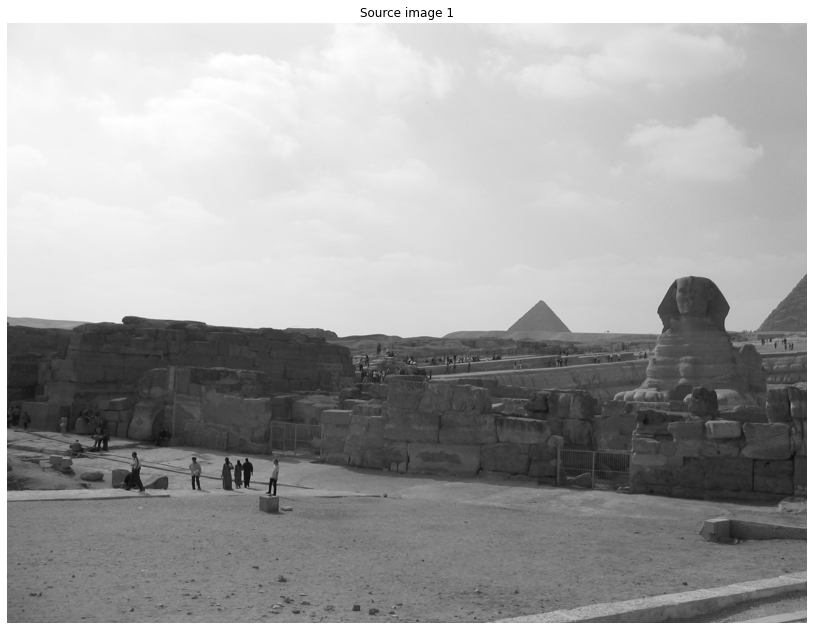

In [84]:
# Read source image.                                                                                                    
im_src1 = cv2.imread('cairo1.png');
# OpenCV reads images in BGR format. Convert to RGB
#im_src1 = cv2.cvtColor(im_src1, cv2.COLOR_BGR2RGB)
im_src2 = cv2.imread('cairo2.png');
im_src3 = cv2.imread('cairo3.png');

display_image(im_src1, 'Source image 1', size=1.0) 


To paste an image into a planar surface, we have to compute an homography between the source image and the target planar region. The, we will project each source pixel into the destination image.

In this case, the correspondences used to compute the homography will be the coordinates of the four corners of the source image and the coordenates of the four corners of the planar surface (that have been obtained manually).

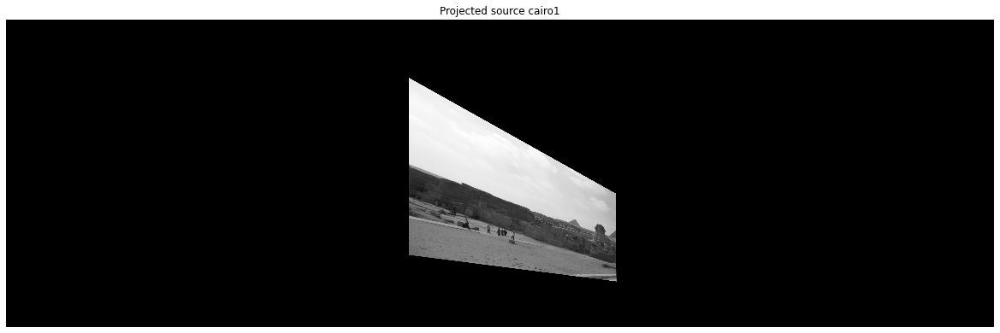

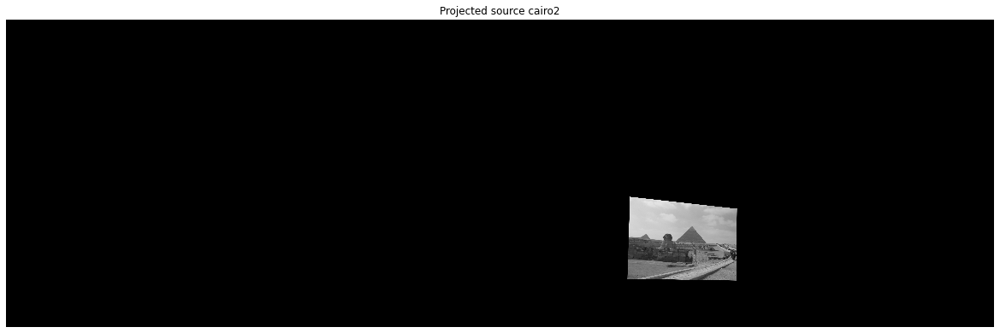

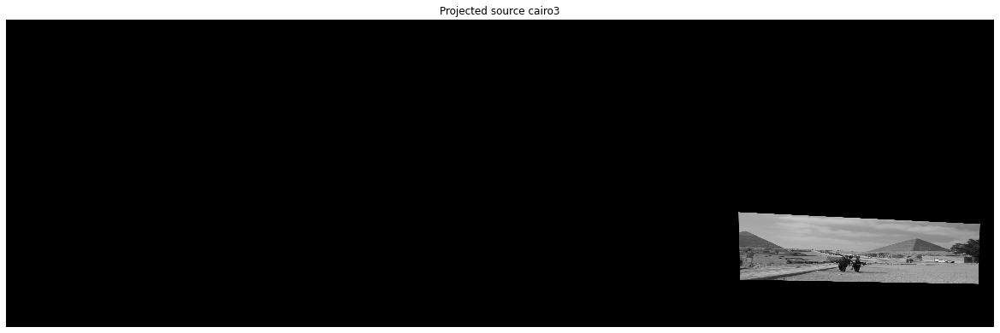

In [76]:
# Source image dimensions
h1,w1, _ = im_src1.shape
h2,w2, _ = im_src2.shape
h3,w3, _ = im_src3.shape
# Create a vector of the four source image (im_src1) corners.                                                                                     
pts_src1 = np.array([[0,0], [w1-1, 0], [w1-1, h1-1],[0, h1-1]],dtype=float);
pts_src2 = np.array([[0,0], [w1-1, 0], [w1-1, h1-1],[0, h1-1]],dtype=float);
pts_src3 = np.array([[0,0], [w1-1, 0], [w1-1, h1-1],[0, h1-1]],dtype=float);
# Calculate Homography between source and destination points                                                            
H1, status1 = cv2.findHomography(pts_src1, surface1);
H2, status2 = cv2.findHomography(pts_src2, surface2);
H3, status3 = cv2.findHomography(pts_src3, surface3);
# Warp source image                                                                                                     
im_tmp1 = cv2.warpPerspective(im_src1, H1, (im_dst.shape[1],im_dst.shape[0]))
display_image(im_tmp1, 'Projected source cairo1', size = 1.0)

im_tmp2 = cv2.warpPerspective(im_src2, H2, (im_dst.shape[1],im_dst.shape[0]))
display_image(im_tmp2, 'Projected source cairo2', size = 1.0)

im_tmp3 = cv2.warpPerspective(im_src3, H3, (im_dst.shape[1],im_dst.shape[0]))
display_image(im_tmp3, 'Projected source cairo3', size = 1.0)

Now we have to combine the projected source image and the destination image. We can not use a simple addtion between the two images because in the projected area the old and new content will be mixed.

A possible way to do the  combination is to remove the projected area in the destination image. This is, we will set to zero the pixels in this region.

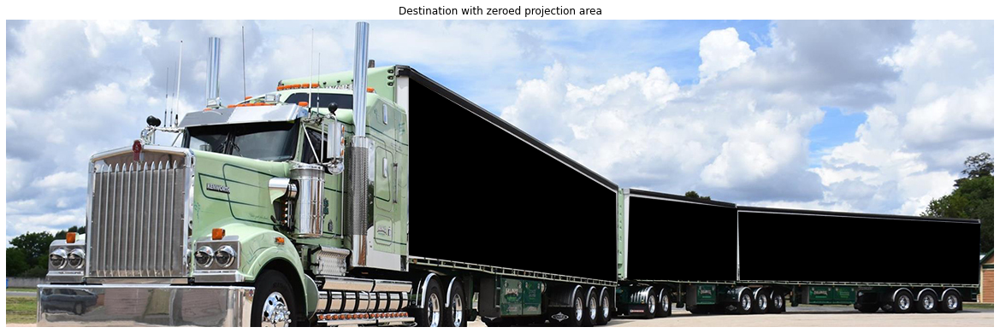

In [77]:
# Black out a polygonal area in destination image.                                                                        
cv2.fillConvexPoly(im_dst, surface1.astype(int), 0, 16);
cv2.fillConvexPoly(im_dst, surface2.astype(int), 0, 16);
cv2.fillConvexPoly(im_dst, surface3.astype(int), 0, 16);
display_image(im_dst, 'Destination with zeroed projection area', size = 1.0)


Now it is possible to obtain the final result just by adding the two images:

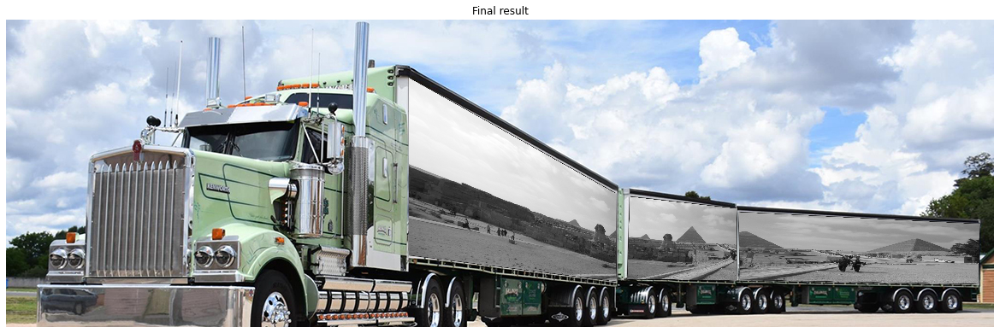

In [78]:
# Add warped source image to destination image.                                                                         
im_dst = im_dst + im_tmp1 + im_tmp2 +im_tmp3
display_image(im_dst, 'Final result', size = 1.0)

The final step is to repeat this proces for the two remaining surfaces. 

<font color=red>**Question 7: Find two suitable images (the dimensions should be similar to those of the areas of the trailer walls) and project them into the destination image. Display the results**</font>

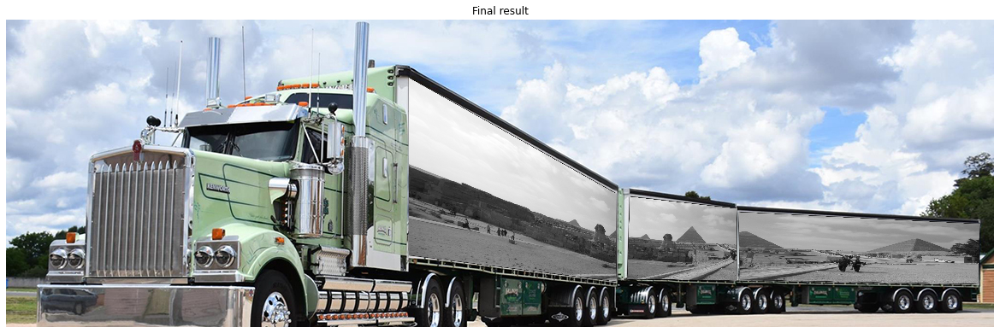

In [79]:
# TODO: Project two images into the areas surface2 and surface3. 
# Display the final destination image.


display_image(im_dst, 'Final result', size = 1.0)
